In [13]:
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import os
import numpy as np
from sklearn.model_selection import train_test_split # Для удобства разделения
import shutil

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import os
import numpy as np
import shutil
from sklearn.model_selection import train_test_split


# Путь к исходным данным
original_dataset_dir = '../datasets/Dataset_flowers'  # структура: папка с 5 подпапками
# Путь для сохранения аугментированных изображений
augmented_dataset_dir = '../datasets/Dataset_flowers_append'


# # Создайте структуру папок для аугментированных данных
# for class_name in os.listdir(original_dataset_dir):
#     os.makedirs(os.path.join(augmented_dataset_dir, class_name), exist_ok=True)

# # Настройте параметры аугментации
# datagen = ImageDataGenerator(
#     rotation_range=40,      # случайный поворот
#     width_shift_range=0.2,  # случайное смещение по горизонтали
#     height_shift_range=0.2, # случайное смещение по вертикали
#     shear_range=0.2,        # сдвиг (shear)
#     zoom_range=0.2,         # случайный зум
#     horizontal_flip=True,   # горизонтальное отражение
#     fill_mode='nearest'     # метод заполнения новых пикселей
# )

# # Примените аугментацию к каждому изображению
# print("Запуск аугментации изображений...")
# for class_name in os.listdir(original_dataset_dir):
#     class_dir = os.path.join(original_dataset_dir, class_name)
#     augmented_class_dir = os.path.join(augmented_dataset_dir, class_name)
    
#     for img_file in os.listdir(class_dir):
#         img_path = os.path.join(class_dir, img_file)
#         img = tf.keras.utils.load_img(img_path)
#         x = tf.keras.utils.img_to_array(img)
#         x = x.reshape((1,) + x.shape)  # преобразование в массив с размерностью (1, height, width, channels)
        
#         i = 0
#         for batch in datagen.flow(x, batch_size=1):
#             # Сохраните аугментированные изображения в папку
#             augmented_img_path = os.path.join(augmented_class_dir, f"{os.path.splitext(img_file)[0]}_aug_{i}.jpg")
#             tf.keras.utils.save_img(augmented_img_path, batch[0])
#             i += 1
#             if i >= 20:  # количество аугментированных изображений на одно исходное
#                 break

# print("Аугментация завершена.")

In [4]:
# Путь к исходным данным
original_dataset_dir = "../datasets/Dataset_flowers"  
# Путь для сохранения аугментированных изображений
augmented_dataset_dir = "../datasets/Dataset_flowers_append"

3,165 Files, 5 Folders

In [ ]:

# Размеры изображений и пакетный размер
IMG_HEIGHT = 150
IMG_WIDTH = 150
BATCH_SIZE = 32

# Пропорции для разделения данных
TRAIN_SPLIT = 0.7
VAL_SPLIT = 0.15
TEST_SPLIT = 0.15


base_dir = '../datasets/flowers_split' # Новая базовая папка для разделенных данных
# --- Создание новой структуры папок ---
def create_split_folders(base_dir, class_names):
    for subset in ['train', 'validation', 'test']:
        for class_name in class_names:
            path = os.path.join(base_dir, subset, class_name)
            os.makedirs(path, exist_ok=True)
    print(f"Структура папок для разделенных данных создана в: {base_dir}")

# Получаем имена классов из исходного набора
class_names = sorted(os.listdir(augmented_dataset_dir))
num_classes = len(class_names)
print(f"Обнаружено {num_classes} классов: {class_names}")

create_split_folders(base_dir, class_names)

# --- Распределение изображений по папкам ---
print("Начало ручного разделения изображений...")
for class_name in class_names:
    class_source_path = os.path.join(augmented_dataset_dir, class_name)
    images = [os.path.join(class_source_path, img) for img in os.listdir(class_source_path) if img.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    
    # Разделение на train и (val + test)
    train_images, val_test_images = train_test_split(images, train_size=TRAIN_SPLIT, random_state=42)
    
    # Разделение (val + test) на val и test
    # Пропорция val_test_split для val будет val_split / (val_split + test_split)
    val_images, test_images = train_test_split(val_test_images, test_size=TEST_SPLIT/(VAL_SPLIT + TEST_SPLIT), random_state=42)
    
    print(f"Класс '{class_name}': Train - {len(train_images)}, Validation - {len(val_images)}, Test - {len(test_images)}")

    # Копирование файлов
    for img_path in train_images:
        shutil.copy(img_path, os.path.join(base_dir, 'train', class_name, os.path.basename(img_path)))
    for img_path in val_images:
        shutil.copy(img_path, os.path.join(base_dir, 'validation', class_name, os.path.basename(img_path)))
    for img_path in test_images:
        shutil.copy(img_path, os.path.join(base_dir, 'test', class_name, os.path.basename(img_path)))

print("Разделение изображений завершено.")


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# --- Создание генераторов данных с учетом новой структуры ---
train_datagen = ImageDataGenerator(rescale=1./255) # Только нормализация, аугментация уже выполнена
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join(base_dir, 'train'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    os.path.join(base_dir, 'validation'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    os.path.join(base_dir, 'test'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False # Важно для последовательной оценки
)

Found 44310 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.


# Примеры до и после аугументации

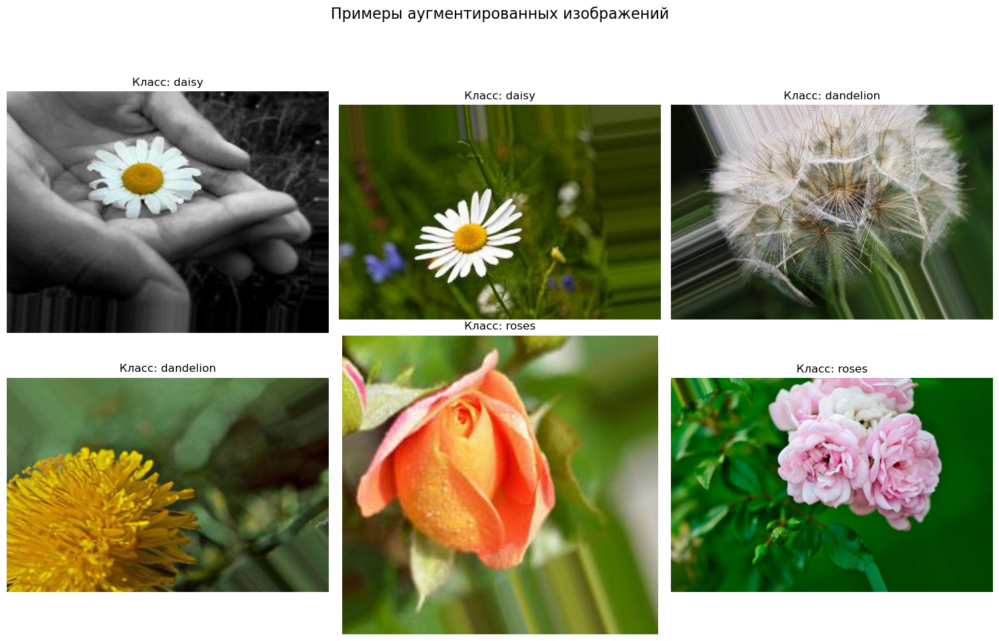

In [9]:
import os
import matplotlib.pyplot as plt

selected_augmented_images = []
# Количество изображений для демонстрации
num_images_to_show = 6 # Покажем 6 аугментированных изображений
# Пройдемся по папкам классов в аугментированном наборе данных
for class_name in os.listdir(augmented_dataset_dir):
    class_dir = os.path.join(augmented_dataset_dir, class_name)
    if os.path.isdir(class_dir): # Убедимся, что это папка
        images_in_class = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if images_in_class:
            # Выбираем несколько случайных аугментированных изображений из этого класса
            np.random.shuffle(images_in_class) # Перемешиваем, чтобы получить случайные
            for img_file in images_in_class[:num_images_to_show // len(os.listdir(augmented_dataset_dir)) + 1]:
                selected_augmented_images.append(os.path.join(class_dir, img_file))
                if len(selected_augmented_images) >= num_images_to_show:
                    break
        if len(selected_augmented_images) >= num_images_to_show:
            break

if not selected_augmented_images:
    print(f"Не найдено аугментированных изображений в '{augmented_dataset_dir}'. Убедитесь, что аугментация была выполнена.")
else:
    plt.figure(figsize=(15, 10))
    plt.suptitle("Примеры аугментированных изображений", fontsize=16)

    for i, img_path in enumerate(selected_augmented_images):
        try:
            img = tf.keras.utils.load_img(img_path)
            plt.subplot(num_images_to_show // 3 + (1 if num_images_to_show % 3 > 0 else 0), 3, i + 1)
            plt.imshow(img)
            # Извлекаем имя класса из пути
            class_name = os.path.basename(os.path.dirname(img_path))
            plt.title(f"Класс: {class_name}")
            plt.axis('off')
        except Exception as e:
            print(f"Не удалось загрузить изображение {img_path}: {e}")
            continue

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Регулируем отступы для заголовка
    plt.show()


In [10]:


print(f"Текущий рабочий каталог: {os.getcwd()}")


Текущий рабочий каталог: E:\study\mag\1_2\Intelligent_analysis_and_data_processing\notebooks\lab4\notebooks


# Построение сверточной нейроной сети

In [14]:
# Построение модели CNN

from tensorflow.keras.layers import Dense, Conv2D, Flatten, Input, MaxPooling2D, BatchNormalization
from tensorflow.keras import layers
from tensorflow.keras import models

model = models.Sequential()

# Блоки Conv2D + MaxPooling2D
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                        kernel_regularizer=regularizers.l2(0.0001)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu',
                        kernel_regularizer=regularizers.l2(0.0001)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu',
                        kernel_regularizer=regularizers.l2(0.0001)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu',
                        kernel_regularizer=regularizers.l2(0.0001)))
model.add(layers.MaxPooling2D((2, 2)))
# Теперь размер будет 9x9

# Разглаживаем выход для полносвязных слоев
model.add(layers.Flatten())

# Полносвязные слои (двухслойная сеть)
model.add(layers.Dense(512, activation='relu',
                        kernel_regularizer=regularizers.l2(0.0001)))
model.add(layers.Dropout(0.5)) # Dropout для борьбы с переобучением
model.add(layers.Dense(num_classes, activation='softmax')) # num_classes для 5 классов

# Компиляция модели
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Вывод информации о модели
model.summary()

S:\anaconda\envs\study\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       3,211,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,455,173 (13.18 MB)

 Trainable params: 3,455,173 (13.18 MB)

 Non-trainable params: 0 (0.00 B)

# Обучение сети с валидацией

In [17]:
# Обучение модели
epochs = 20 
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True) 
]

print("\nНачало обучения модели...")
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE,
    callbacks=callbacks
)
print("Обучение завершено.")


Начало обучения модели...
Epoch 1/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 372s 269ms/step - accuracy: 0.6446 - loss: 0.9554 - val_accuracy: 0.7513 - val_loss: 0.7372
Epoch 2/20
   1/1384 ━━━━━━━━━━━━━━━━━━━━ 2:52 125ms/step - accuracy: 0.7500 - loss: 0.8292

S:\anaconda\envs\study\Lib\site-packages\keras\src\trainers\epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1384/1384 ━━━━━━━━━━━━━━━━━━━━ 15s 11ms/step - accuracy: 0.7500 - loss: 0.8292 - val_accuracy: 0.7496 - val_loss: 0.7326
Epoch 3/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 201s 145ms/step - accuracy: 0.7616 - loss: 0.7120 - val_accuracy: 0.8027 - val_loss: 0.6279
Epoch 4/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.8438 - loss: 0.5860 - val_accuracy: 0.8005 - val_loss: 0.6313
Epoch 5/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 203s 146ms/step - accuracy: 0.8153 - loss: 0.5995 - val_accuracy: 0.7948 - val_loss: 0.6921
Epoch 6/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.7812 - loss: 0.5724 - val_accuracy: 0.7973 - val_loss: 0.6720
Epoch 7/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 200s 144ms/step - accuracy: 0.8511 - loss: 0.5307 - val_accuracy: 0.8600 - val_loss: 0.5140
Epoch 8/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 16s 11ms/step - accuracy: 0.9062 - loss: 0.5299 - val_accuracy: 0.8605 - val_loss: 0.5153
Epoch 9/20
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 200s 144ms/step - accuracy: 0.8796 - lo

Оценка точности и потерь, построение графиков

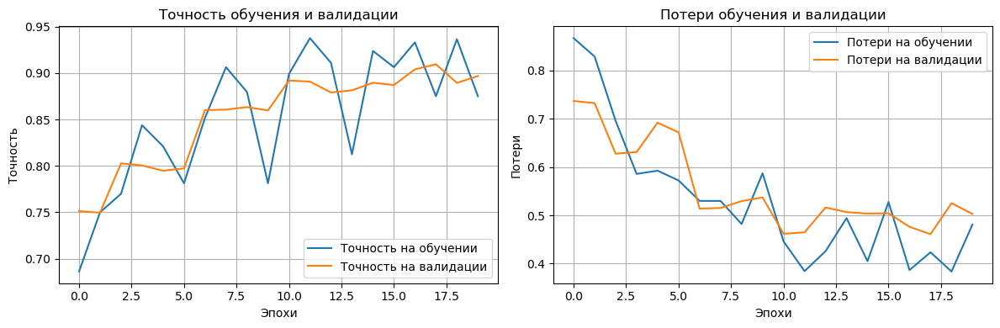

In [18]:
# Построение графиков точности и потерь
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Точность на обучении')
plt.plot(epochs_range, val_acc, label='Точность на валидации')
plt.title('Точность обучения и валидации')
plt.xlabel('Эпохи')
plt.ylabel('Точность')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Потери на обучении')
plt.plot(epochs_range, val_loss, label='Потери на валидации')
plt.title('Потери обучения и валидации')
plt.xlabel('Эпохи')
plt.ylabel('Потери')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Тестирование обученной сети на тестовой выборке
Теперь мы используем test_generator, который был создан из независимой тестовой выборки, для окончательной оценки производительности модели. Это дает наиболее реалистичное представление о том, насколько хорошо модель будет работать на новых, ранее невидимых данных.


Оценка модели на независимой тестовой выборке:
296/296 ━━━━━━━━━━━━━━━━━━━━ 58s 197ms/step - accuracy: 0.9333 - loss: 0.4091
Потери на тестовой выборке: 0.4489
Точность на тестовой выборке: 0.9185
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


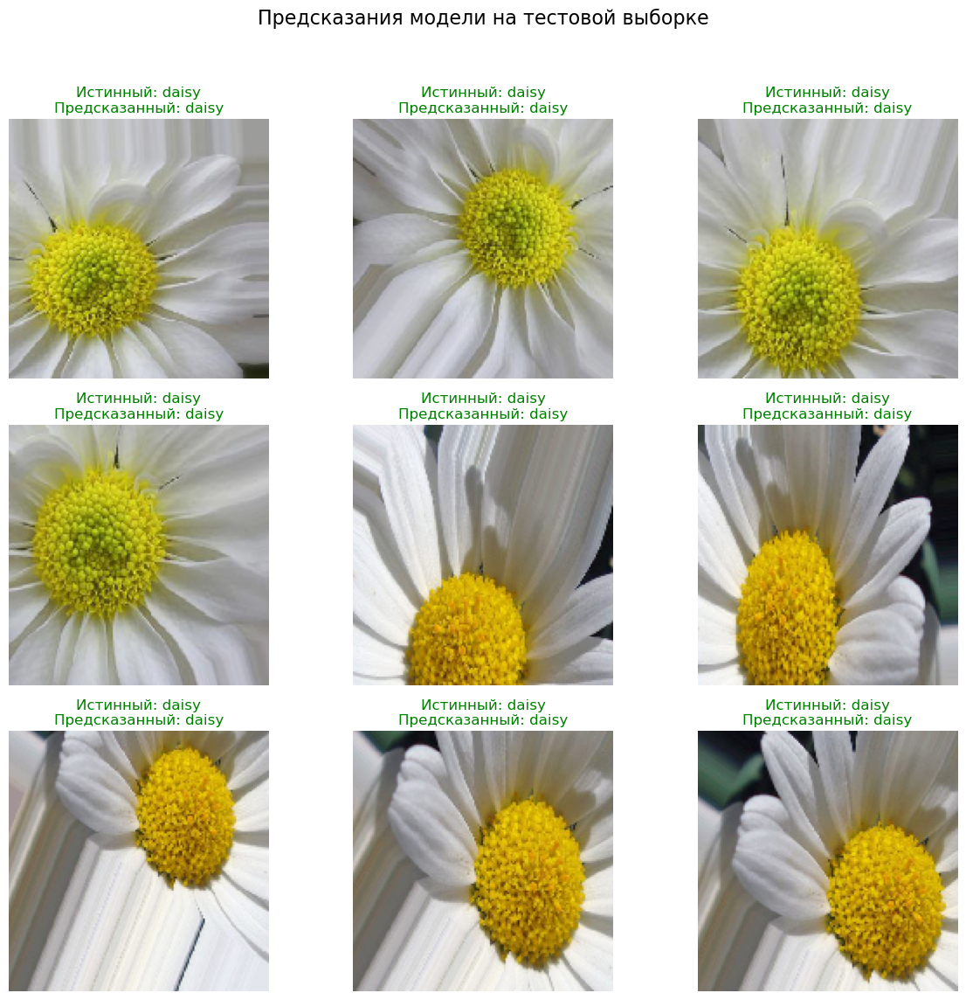

In [20]:

import math # Для расчета размеров сетки

print("\nОценка модели на независимой тестовой выборке:")
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // BATCH_SIZE)
print(f"Потери на тестовой выборке: {loss:.4f}")
print(f"Точность на тестовой выборке: {accuracy:.4f}")

# --- Визуализация нескольких предсказаний ---

num_images_to_display = 9 # Количество изображений для отображения в сетке
# Убедимся, что num_images_to_display не превышает количество доступных изображений в test_generator
if num_images_to_display > test_generator.samples:
    num_images_to_display = test_generator.samples
    print(f"Отображаем все {num_images_to_display} изображений из тестовой выборки.")


# Получаем батч изображений и меток из тестового генератора
# Необходимо обнулить генератор, чтобы брать изображения с начала
test_generator.reset()
test_images_batch, test_labels_batch = next(iter(test_generator))


# Делаем предсказания для всего батча
predictions = model.predict(test_images_batch)

# Вычисляем размеры сетки для отображения
grid_cols = 3
grid_rows = math.ceil(num_images_to_display / grid_cols)

plt.figure(figsize=(grid_cols * 4, grid_rows * 4)) # Увеличиваем размер фигуры для лучшей читаемости
plt.suptitle("Предсказания модели на тестовой выборке", fontsize=16)


for i in range(num_images_to_display):
    if i >= len(test_images_batch): # Защита от выхода за пределы батча
        break

    sample_image = test_images_batch[i]
    sample_label = test_labels_batch[i]

    predicted_class_index = np.argmax(predictions[i])
    true_class_index = np.argmax(sample_label)

    true_class_name = class_names[true_class_index]
    predicted_class_name = class_names[predicted_class_index]

    plt.subplot(grid_rows, grid_cols, i + 1)
    plt.imshow(sample_image)
    
    color = "green" if predicted_class_index == true_class_index else "red"
    title_text = f"Истинный: {true_class_name}\nПредсказанный: {predicted_class_name}"
    plt.title(title_text, color=color)
    plt.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Регулируем отступы для общего заголовка
plt.show()



Подготовка изображений для визуализации предсказаний CNN...
Found 9495 images belonging to 5 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


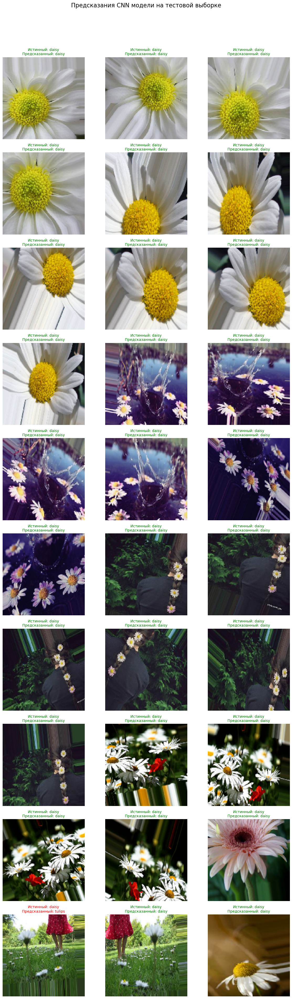

In [28]:
num_images_to_display_cnn = 30

print("\nПодготовка изображений для визуализации предсказаний CNN...")
temp_display_generator_cnn = test_datagen.flow_from_directory(
    os.path.join(base_dir, 'test'), # Используем папку с тестовыми данными
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=num_images_to_display_cnn, # Запрашиваем нужное количество изображений в одном батче
    class_mode='categorical',
    shuffle=False # Важно, чтобы порядок был фиксированным
)

# Берем первый батч изображений и меток из временного генератора
try:
    display_images_batch_cnn, display_labels_batch_cnn = next(iter(temp_display_generator_cnn))
except StopIteration:
    print("Недостаточно изображений в тестовой выборке для отображения.")
    display_images_batch_cnn = np.array([])
    display_labels_batch_cnn = np.array([])


if display_images_batch_cnn.shape[0] == 0:
    print("Невозможно отобразить изображения для предсказаний CNN.")
else:
    # Делаем предсказания для всего полученного батча
    predictions_cnn = model.predict(display_images_batch_cnn)

    # Вычисляем размеры сетки для отображения
    grid_cols = 3
    # Проверяем, сколько изображений фактически получили, если их меньше чем запросили
    actual_num_displayed = display_images_batch_cnn.shape[0]
    grid_rows = math.ceil(actual_num_displayed / grid_cols)

    plt.figure(figsize=(grid_cols * 4, grid_rows * 4)) # Увеличиваем размер фигуры для лучшей читаемости
    plt.suptitle("Предсказания CNN модели на тестовой выборке", fontsize=16)

    for i in range(actual_num_displayed):
        sample_image_cnn = display_images_batch_cnn[i]
        sample_label_cnn = display_labels_batch_cnn[i]

        predicted_class_index_cnn = np.argmax(predictions_cnn[i])
        true_class_index_cnn = np.argmax(sample_label_cnn)

        true_class_name_cnn = class_names[true_class_index_cnn]
        predicted_class_name_cnn = class_names[predicted_class_index_cnn]

        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(sample_image_cnn) # Изображение уже нормализовано (0-1), но imshow справится

        # Определяем цвет текста
        color = "green" if predicted_class_index_cnn == true_class_index_cnn else "red"
        
        # Создаем текст заголовка
        title_text = f"Истинный: {true_class_name_cnn}\nПредсказанный: {predicted_class_name_cnn}"
        plt.title(title_text, color=color, fontsize=10) # Уменьшим шрифт для лучшей читаемости
        plt.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Регулируем отступы для общего заголовка
    plt.show()


In [29]:
# Вычислим размер входного слоя для полносвязной сети (разглаженное изображение)
input_dim = IMG_HEIGHT * IMG_WIDTH * 3 # Высота * Ширина * Каналы (RGB)
print(f"Размер входного слоя для полносвязной сети: {input_dim}")

Размер входного слоя для полносвязной сети: 67500


In [30]:
train_datagen_fc = ImageDataGenerator(rescale=1./255)
validation_datagen_fc = ImageDataGenerator(rescale=1./255)
test_datagen_fc = ImageDataGenerator(rescale=1./255)

train_generator_fc = train_datagen_fc.flow_from_directory(
    os.path.join(base_dir, 'train'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical', # Нужен для FCNN классификации
    shuffle=True # Перемешиваем для обучения
)

validation_generator_fc = validation_datagen_fc.flow_from_directory(
    os.path.join(base_dir, 'validation'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False # Не перемешиваем для валидации
)

test_generator_fc = test_datagen_fc.flow_from_directory(
    os.path.join(base_dir, 'test'),
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False # Не перемешиваем для тестирования
)

# Вычислим размер входного слоя для полносвязной сети (разглаженное изображение)
input_dim = IMG_HEIGHT * IMG_WIDTH * 3 # Высота * Ширина * Каналы (RGB)
print(f"Размер входного слоя для полносвязной сети: {input_dim}")


Found 44310 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Размер входного слоя для полносвязной сети: 67500


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)           │ (None, 67500)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 512)                 │      34,560,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,568,720 (131.87 MB)

 Trainable params: 34,568,720 (131.87 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)           │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 512)                 │           8,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 67500)               │      34,627,500 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,636,204 (132.13 MB)

 Trainable params: 34,636,204 (132.13 MB)

 Non-trainable params: 0 (0.00 B)

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ autoencoder_input (InputLayer)       │ (None, 67500)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ (None, 16)                  │      34,568,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 67500)               │      34,636,204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,204,924 (264.00 MB)

 Trainable params: 69,204,924 (264.00 MB)

 Non-trainable params: 0 (0.00 B)


Начало обучения автокодировщика...
1384/1384 ━━━━━━━━━━━━━━━━━━━━ 623s 450ms/step - loss: 0.0927 - val_loss: 0.0859
Обучение автокодировщика завершено.


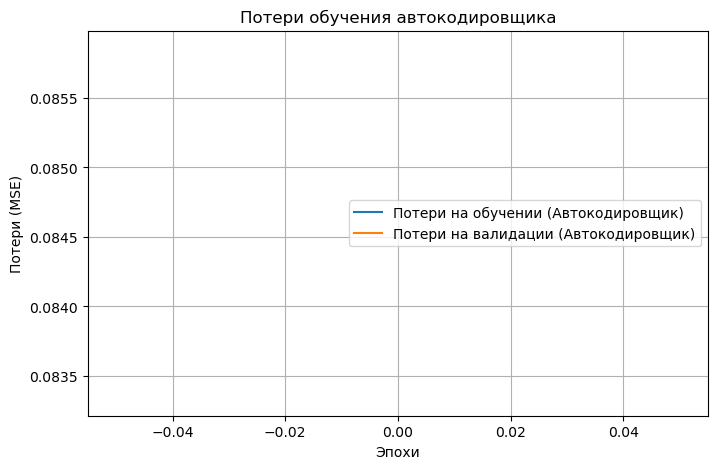

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


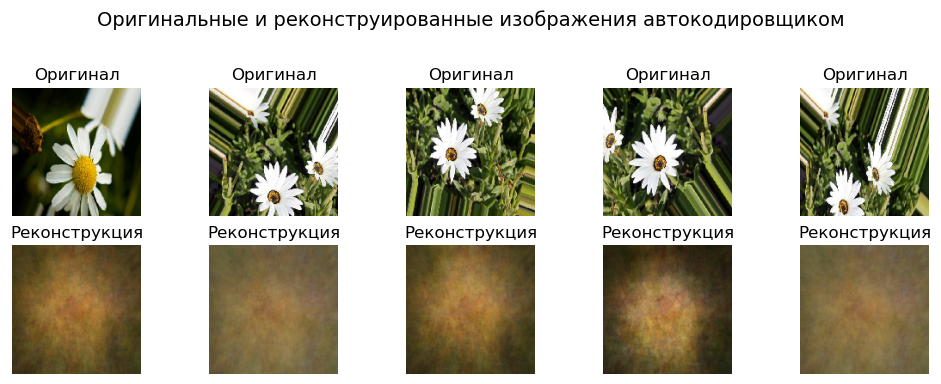

In [41]:
# --- Построение автокодировщика ---
# Размерность закодированного представления (латентное пространство)
encoding_dim = 16 # Можно экспериментировать с этим значением

# Энкодер
encoder_input = layers.Input(shape=(input_dim,), name='encoder_input') # Вход - разглаженное изображение
encoded = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.0001))(encoder_input)
encoded = layers.Dropout(0.3)(encoded)
encoded = layers.Dense(encoding_dim, activation='relu', kernel_regularizer=regularizers.l2(0.0001))(encoded) # Латентное представление

encoder = models.Model(encoder_input, encoded, name='encoder')
encoder.summary()

# Декодер
decoder_input = layers.Input(shape=(encoding_dim,), name='decoder_input')
decoded = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.0001))(decoder_input)
decoded = layers.Dropout(0.3)(decoded)
decoded = layers.Dense(input_dim, activation='sigmoid', kernel_regularizer=regularizers.l2(0.0001))(decoded) # Выход - восстановленное изображение (значения от 0 до 1)

decoder = models.Model(decoder_input, decoded, name='decoder')
decoder.summary()

# Автокодировщик (соединяем энкодер и декодер)
autoencoder_input = layers.Input(shape=(input_dim,), name='autoencoder_input')
autoencoder_output = decoder(encoder(autoencoder_input))
autoencoder = models.Model(autoencoder_input, autoencoder_output, name='autoencoder')

autoencoder.compile(optimizer='adam', loss='mean_squared_error') # MSE - обычная функция потерь для автокодировщиков
autoencoder.summary()

# --- Подготовка данных для обучения автокодировщика ---
# Автокодировщик обучается без меток, вход = выход
# Нам нужно итеративно получать батчи и разглаживать их

def flatten_generator(generator):
    for batch_x, _ in generator: # Игнорируем метки
        yield batch_x.reshape(batch_x.shape[0], -1), batch_x.reshape(batch_x.shape[0], -1) # Вход = Выход

# Создаем "плоские" генераторы для автокодировщика
train_generator_flat = flatten_generator(train_generator_fc)
validation_generator_flat = flatten_generator(validation_generator_fc)


# Обучение автокодировщика
print("\nНачало обучения автокодировщика...")
autoencoder_history = autoencoder.fit(
    train_generator_flat,
    steps_per_epoch=train_generator_fc.samples // BATCH_SIZE,
    epochs=1, # Можно увеличить или уменьшить в зависимости от сходимости
    validation_data=validation_generator_flat,
    validation_steps=validation_generator_fc.samples // BATCH_SIZE,
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)
print("Обучение автокодировщика завершено.")

# --- Графики обучения автокодировщика ---
plt.figure(figsize=(8, 5))
plt.plot(autoencoder_history.history['loss'], label='Потери на обучении (Автокодировщик)')
plt.plot(autoencoder_history.history['val_loss'], label='Потери на валидации (Автокодировщик)')
plt.title('Потери обучения автокодировщика')
plt.xlabel('Эпохи')
plt.ylabel('Потери (MSE)')
plt.legend()
plt.grid(True)
plt.show()

# --- Визуализация реконструкции автокодировщиком ---
# Возьмем несколько изображений из валидационного набора
num_reconstruct_images = 5
sample_images_batch, _ = next(iter(validation_generator_fc))
sample_images = sample_images_batch[:num_reconstruct_images]

# Разглаживаем изображения для энкодера
flat_sample_images = sample_images.reshape(sample_images.shape[0], -1)

# Получаем закодированные представления
encoded_imgs = encoder.predict(flat_sample_images)

# Реконструируем изображения
reconstructed_imgs = decoder.predict(encoded_imgs)

plt.figure(figsize=(10, 4))
plt.suptitle("Оригинальные и реконструированные изображения автокодировщиком", fontsize=14)
for i in range(num_reconstruct_images):
    # Оригинальное изображение
    plt.subplot(2, num_reconstruct_images, i + 1)
    plt.imshow(sample_images[i])
    plt.title("Оригинал")
    plt.axis('off')

    # Реконструированное изображение
    plt.subplot(2, num_reconstruct_images, i + 1 + num_reconstruct_images)
    # Переформируем из одномерного в 2D изображение для отображения
    plt.imshow(reconstructed_imgs[i].reshape(IMG_HEIGHT, IMG_WIDTH, 3))
    plt.title("Реконструкция")
    plt.axis('off')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [42]:
# --- Извлечение признаков с помощью обученного энкодера ---
print("\nИзвлечение признаков с помощью обученного энкодера...")

def extract_features(generator, encoder_model, num_samples):
    features = []
    labels = []
    i = 0
    for batch_x, batch_y in generator:
        flat_batch_x = batch_x.reshape(batch_x.shape[0], -1)
        encoded_features = encoder_model.predict(flat_batch_x, verbose=0) # verbose=0 чтобы не выводить много сообщений
        features.append(encoded_features)
        labels.append(batch_y)
        i += batch_x.shape[0]
        if i >= num_samples:
            break
    return np.vstack(features), np.vstack(labels)

# Получаем закодированные признаки для обучающей, валидационной и тестовой выборок
# Важно обнулить генераторы перед извлечением признаков
train_generator_fc.reset()
validation_generator_fc.reset()
test_generator_fc.reset()

train_features, train_labels = extract_features(train_generator_fc, encoder, train_generator_fc.samples)
val_features, val_labels = extract_features(validation_generator_fc, encoder, validation_generator_fc.samples)
test_features, test_labels = extract_features(test_generator_fc, encoder, test_generator_fc.samples)

print(f"Размер обучающих признаков: {train_features.shape}")
print(f"Размер валидационных признаков: {val_features.shape}")
print(f"Размер тестовых признаков: {test_features.shape}")



Извлечение признаков с помощью обученного энкодера...
Размер обучающих признаков: (44310, 16)
Размер валидационных признаков: (9495, 16)
Размер тестовых признаков: (9495, 16)


In [43]:
# --- Построение полносвязной сети для классификации ---
classification_model = models.Sequential()
# Входной слой принимает закодированное представление
classification_model.add(layers.Input(shape=(encoding_dim,)))
classification_model.add(layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.0001)))
classification_model.add(layers.Dropout(0.5)) # Дропаут для борьбы с переобучением
classification_model.add(layers.Dense(num_classes, activation='softmax')) # 5 классов

classification_model.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

classification_model.summary()

# --- Обучение полносвязной сети ---
print("\nНачало обучения полносвязной сети для классификации...")
classification_history = classification_model.fit(
    train_features, train_labels,
    epochs=100, # Увеличиваем эпохи, т.к. данные уже предобработаны
    batch_size=BATCH_SIZE,
    validation_data=(val_features, val_labels),
    callbacks=[EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)]
)
print("Обучение полносвязной сети завершено.")


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_30 (Dense)                     │ (None, 256)                 │           4,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,637 (22.02 KB)

 Trainable params: 5,637 (22.02 KB)

 Non-trainable params: 0 (0.00 B)


Начало обучения полносвязной сети для классификации...
Epoch 1/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.2541 - loss: 4.5941 - val_accuracy: 0.3167 - val_loss: 1.5134
Epoch 2/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3044 - loss: 1.5302 - val_accuracy: 0.3054 - val_loss: 1.5179
Epoch 3/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3043 - loss: 1.5263 - val_accuracy: 0.3081 - val_loss: 1.5125
Epoch 4/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3000 - loss: 1.5283 - val_accuracy: 0.3186 - val_loss: 1.5092
Epoch 5/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3017 - loss: 1.5265 - val_accuracy: 0.3169 - val_loss: 1.5068
Epoch 6/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3050 - loss: 1.5243 - val_accuracy: 0.3154 - val_loss: 1.5077
Epoch 7/100
1385/1385 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3067 - loss: 1.5234 - val_accuracy: 0.3096 - val_loss: 1.5092
Epoch 8/100
1385/1385 ━━━━━

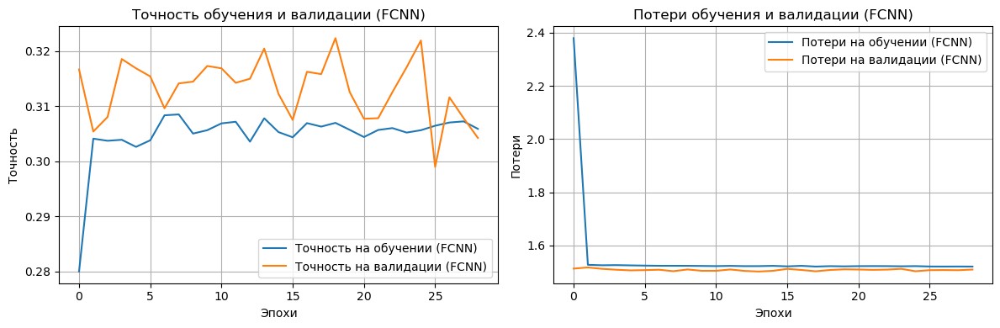


Оценка полносвязной сети на независимой тестовой выборке:
Потери на тестовой выборке (FCNN): 1.5065
Точность на тестовой выборке (FCNN): 0.3228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.
Found 9495 images belonging to 5 classes.


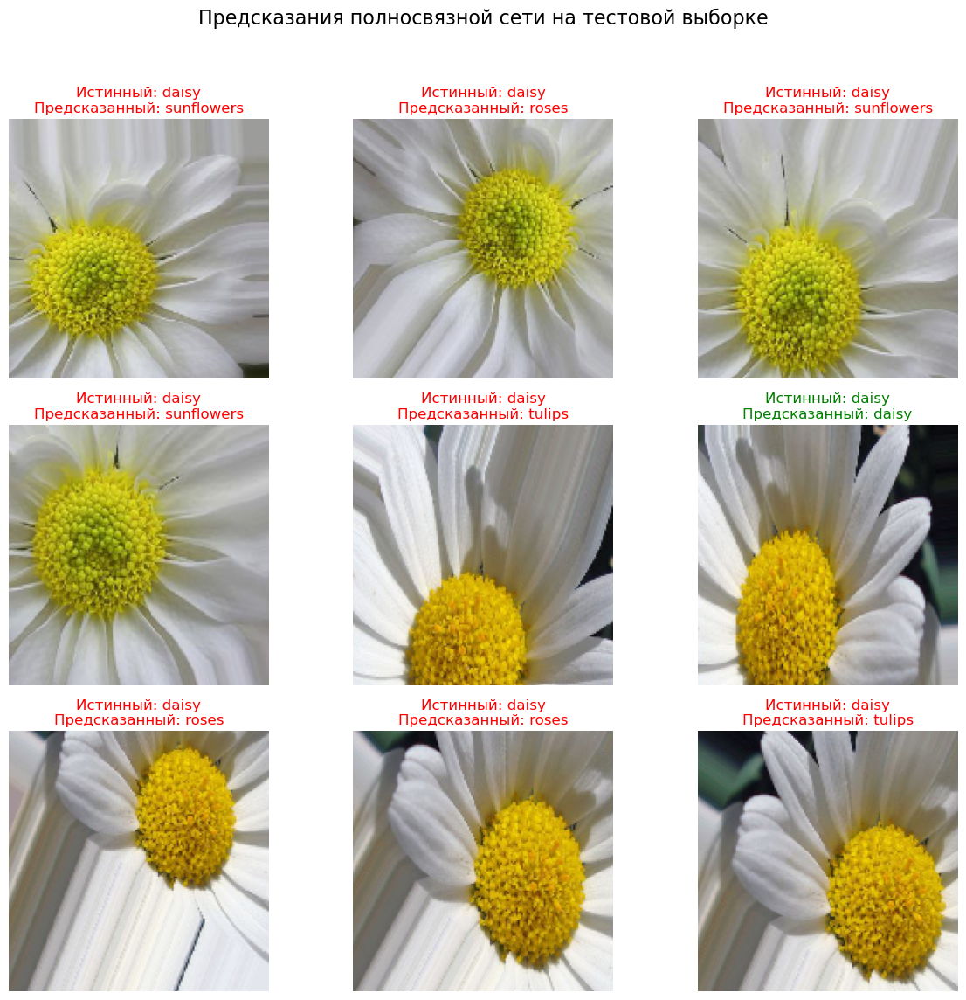

In [44]:
# --- Графики обучения полносвязной сети ---
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(classification_history.history['accuracy'], label='Точность на обучении (FCNN)')
plt.plot(classification_history.history['val_accuracy'], label='Точность на валидации (FCNN)')
plt.title('Точность обучения и валидации (FCNN)')
plt.xlabel('Эпохи')
plt.ylabel('Точность')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(classification_history.history['loss'], label='Потери на обучении (FCNN)')
plt.plot(classification_history.history['val_loss'], label='Потери на валидации (FCNN)')
plt.title('Потери обучения и валидации (FCNN)')
plt.xlabel('Эпохи')
plt.ylabel('Потери')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Тестирование полносвязной сети на тестовой выборке ---
print("\nОценка полносвязной сети на независимой тестовой выборке:")
loss_test, accuracy_test = classification_model.evaluate(test_features, test_labels, verbose=0)
print(f"Потери на тестовой выборке (FCNN): {loss_test:.4f}")
print(f"Точность на тестовой выборке (FCNN): {accuracy_test:.4f}")

# --- Визуализация нескольких предсказаний FCNN на тестовой выборке ---
num_images_to_display_fcnn = 9
# Убедимся, что num_images_to_display_fcnn не превышает количество доступных изображений
if num_images_to_display_fcnn > test_features.shape[0]:
    num_images_to_display_fcnn = test_features.shape[0]

predictions_fcnn = classification_model.predict(test_features[:num_images_to_display_fcnn])

grid_cols_fcnn = 3
grid_rows_fcnn = math.ceil(num_images_to_display_fcnn / grid_cols_fcnn)

plt.figure(figsize=(grid_cols_fcnn * 4, grid_rows_fcnn * 4))
plt.suptitle("Предсказания полносвязной сети на тестовой выборке", fontsize=16)

for i in range(num_images_to_display_fcnn):
    predicted_class_index_fcnn = np.argmax(predictions_fcnn[i])
    true_class_index_fcnn = np.argmax(test_labels[i])

    true_class_name_fcnn = class_names[true_class_index_fcnn]
    predicted_class_name_fcnn = class_names[predicted_class_index_fcnn]

    plt.subplot(grid_rows_fcnn, grid_cols_fcnn, i + 1)

    temp_test_gen = test_datagen_fc.flow_from_directory(
        os.path.join(base_dir, 'test'),
        target_size=(IMG_HEIGHT, IMG_WIDTH),
        batch_size=num_images_to_display_fcnn,
        class_mode='categorical',
        shuffle=False
    )
    original_test_images, _ = next(iter(temp_test_gen)) # Получаем первые N изображений

    plt.imshow(original_test_images[i])
    
    color_fcnn = "green" if predicted_class_index_fcnn == true_class_index_fcnn else "red"
    title_text_fcnn = f"Истинный: {true_class_name_fcnn}\nПредсказанный: {predicted_class_name_fcnn}"
    plt.title(title_text_fcnn, color=color_fcnn)
    plt.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()